# Print the results


In [1]:
%matplotlib inline

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb

import skimage.io
import skimage.morphology
import skimage.segmentation

import utils.evaluation

### Configuration

In [3]:
from my_config import config_vars

# Partition of the data to make predictions (test or validation)
partition = "validation"

experiment_name = '00'

config_vars = utils.dirtools.setup_experiment(config_vars, experiment_name)

data_partitions = utils.dirtools.read_data_partitions(config_vars)

In [4]:
config_vars

{'root_directory': 'FISH/',
 'max_training_images': 0,
 'create_split_files': True,
 'training_fraction': 0.8,
 'validation_fraction': 0.1,
 'transform_images_to_PNG': True,
 'pixel_depth': 8,
 'min_nucleus_size': 25,
 'boundary_size': 2,
 'augment_images': False,
 'elastic_points': 16,
 'elastic_distortion': 5,
 'elastic_augmentations': 10,
 'learning_rate': 0.0001,
 'epochs': 15,
 'steps_per_epoch': 500,
 'batch_size': 10,
 'val_batch_size': 10,
 'rescale_labels': True,
 'crop_size': 256,
 'cell_min_size': 16,
 'boundary_boost_factor': 1,
 'object_dilation': 3,
 'raw_images_dir': 'FISH/raw_images/',
 'raw_annotations_dir': 'FISH/raw_annotations/',
 'path_files_training': 'FISH/training.txt',
 'path_files_validation': 'FISH/validation.txt',
 'path_files_test': 'FISH/test.txt',
 'normalized_images_dir': 'FISH/norm_images/',
 'boundary_labels_dir': 'FISH/boundary_labels/',
 'experiment_dir': 'FISH/experiments/00/out/',
 'probmap_out_dir': 'FISH/experiments/00/out/prob/',
 'labels_out_di

In [5]:
# To evaluate segmentations produced by other segmentation algorithms (e.g. CellProfiler), 
# manually modify the following config var:

#config_vars["labels_out_dir"] = "/data/cellprofiler_segmentations/"
#config_vars["object_dilation"] = 2

### Auxiliary visualization function

### Run the evaluation
Predictions are the ones stored in Step 03 and loaded here for evaluation calculations  
label the ground truth(raw annotations) and compare with the predicted labels

#### show the comparison between norm_image, raw_annot and label_out

In [2]:
import matplotlib as mpl
mpl.rcParams["image.cmap"] # default to viridis

'viridis'

In [3]:
mpl.rcParams["image.cmap"] = 'viridis'

In [4]:
labels_dirs = ['CELL/DNA_FISH/experiments/00/out/segm/',
              'CELL/IF_images/experiments/00/out/segm/',
              'CELL/Lineage_Tracking_ZY_images/experiments/00/out/segm/',
              'CELL/seg_samples_KZ_images/experiments/00/out/segm/']

In [8]:
images_dirs = ['CELL/DNA_FISH/norm_images/',
              'CELL/IF_images/norm_images/',
              'CELL/Lineage_Tracking_ZY_images/norm_images/',
              'CELL/seg_samples_KZ_images/norm_images/']

In [5]:
img_name = "0000.png"
pred_label_filename = os.path.join(labels_dirs[0], img_name)
pred_label = skimage.io.imread(pred_label_filename)
pred_label = skimage.segmentation.relabel_sequential(pred_label)[0]

inc = lambda x: x if x == 0 else x + 100
inc = np.vectorize(inc)  # this is implemented by for loop
pred_label = inc(pred_label)
print(type(pred_label))
pred_label.min()

<class 'numpy.ndarray'>


0

In [39]:
def difference(raw_label, pred_label):
    ground_truth = raw_label.copy()
    prediction = pred_label.copy()
    IOU = utils.evaluation.intersection_over_union(ground_truth, prediction)
    diff = np.zeros(ground_truth.shape + (3,))  # become 3 channels
    A = ground_truth.copy()
    B = prediction.copy()
    A[A > 0] = 1
    B[B > 0] = 1
    D = A - B
    #diff[D > 0,:2] = 1
    #diff[D < 0,1:] = 1
    
    # Object-level errors
    C = IOU.copy()
    threshold = 0.5  # if set to 0.8, more misses will appear, but 0.5 no miss
    C[C >= threshold] = 1
    C[C < threshold] = 0
    missed = np.where(np.sum(C, axis = 1) == 0)[0]  # for original cell, none predict cell match 
    extra = np.where(np.sum(C, axis = 0) == 0)[0]  # for predict cell, none original cell match

    for m in missed:
        diff[ground_truth == m + 1, 0] = 1
    for e in extra:
        diff[prediction == e + 1, 2] = 1
        
    return diff, str(len(missed)), str(len(extra))

In [18]:
def compare(img_name):
    original_images = []
    pred_labels = []
    for i in range(4):
        ori_img_filename = os.path.join(images_dirs[i], img_name)
        original_image = skimage.io.imread(ori_img_filename)
    
        pred_label_filename = os.path.join(labels_dirs[i], img_name)
        pred_label = skimage.io.imread(pred_label_filename)
        
        struct = skimage.morphology.square(3)
        pred_label = skimage.morphology.dilation(pred_label, struct)
        pred_label = skimage.segmentation.relabel_sequential(pred_label)[0] #[30:-30,30:-30])[0]
            
        # make graph easier to look
        inc = lambda x: x if x == 0 else x + 100
        inc = np.vectorize(inc)
        pred_label = inc(pred_label)
        
        original_images.append(original_image)
        pred_labels.append(pred_label)
        
    fig, ax = plt.subplots(2, 4, figsize=(20,10))
    fig.suptitle(img_name)
    ax[0][0].set_title("DNA_FISH")
    ax[0][0].imshow(original_images[0])
    ax[0][1].set_title("IF_images")
    ax[0][1].imshow(original_images[1])
    ax[0][2].set_title("Linear_Tracking_zy")
    ax[0][2].imshow(original_images[2])
    ax[0][3].set_title("Linear_Tracking_kz")
    ax[0][3].imshow(original_images[3])
    
#     ax[1][0].set_title("DNA_FISH")
    ax[1][0].imshow(pred_labels[0])
#     ax[1][1].set_title("IF_images")
    ax[1][1].imshow(pred_labels[1])
#     ax[1][2].set_title("Linear_Tracking_zy")
    ax[1][2].imshow(pred_labels[2])
#     ax[1][3].set_title("Linear_Tracking_kz")
    ax[1][3].imshow(pred_labels[3])


    # plt.figure(figsize=(6,6))
    # plt.imshow(original_image)  #, cmap="nipy_spectral")
    # plt.show()

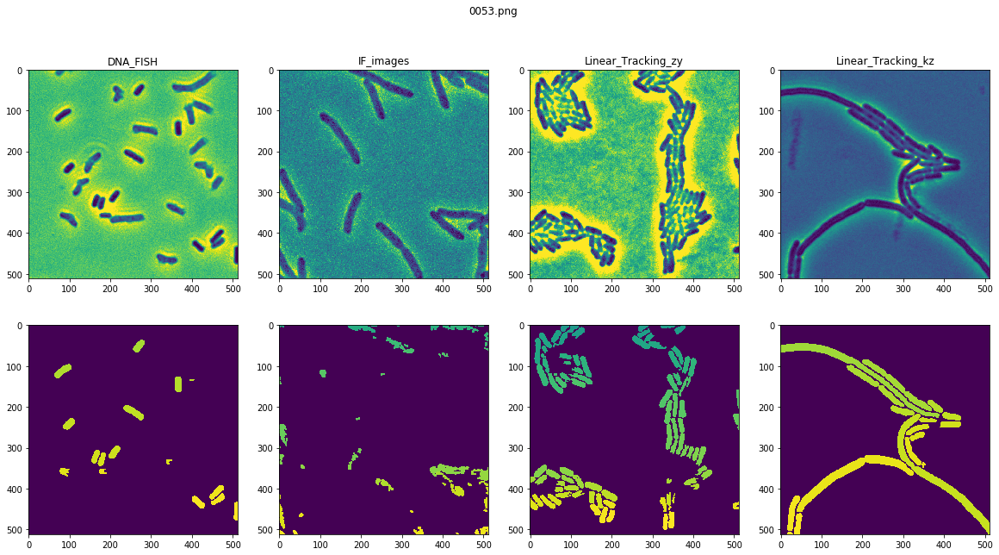

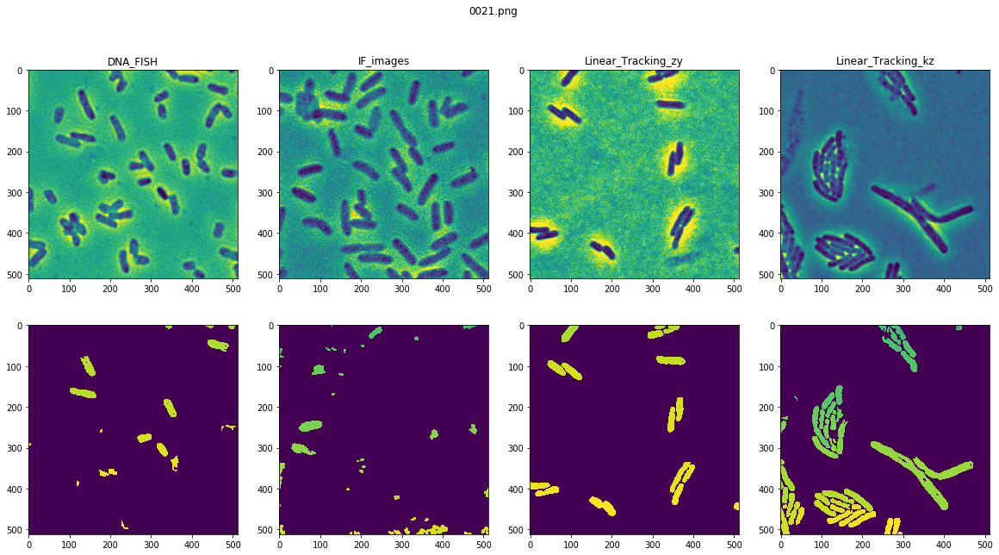

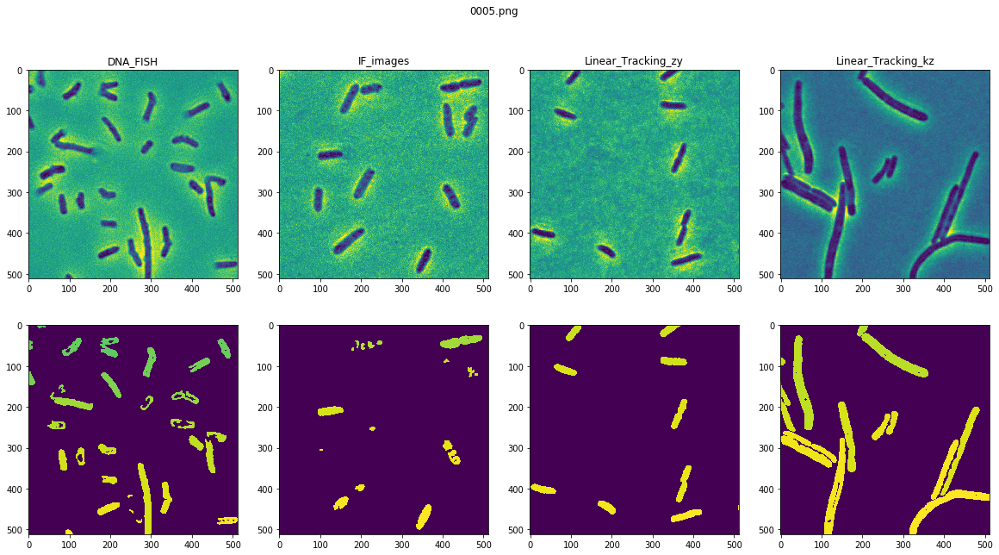

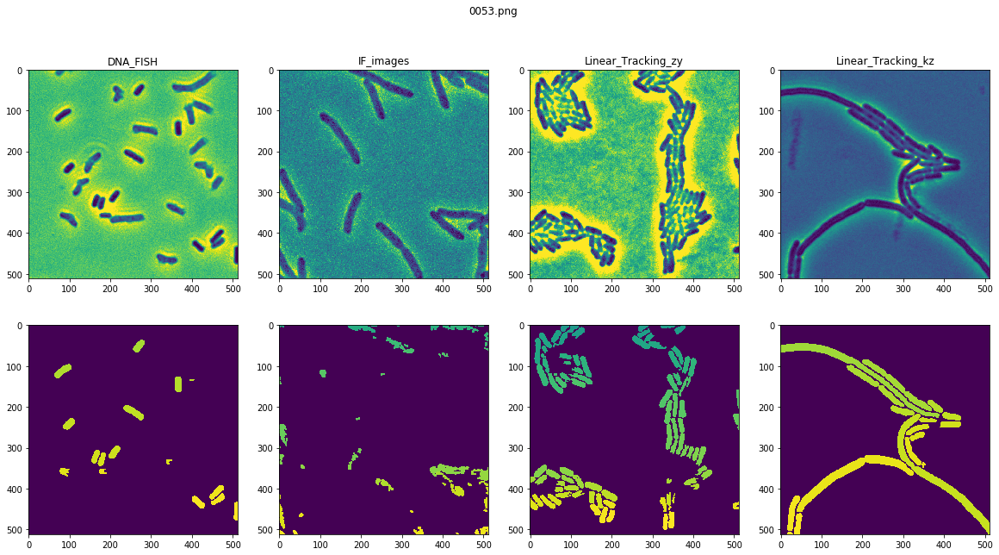

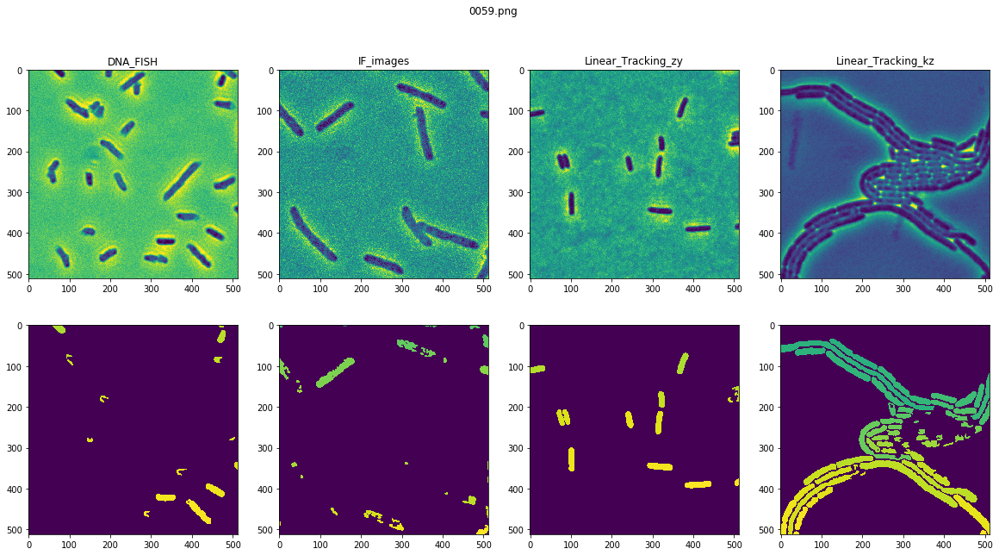

...

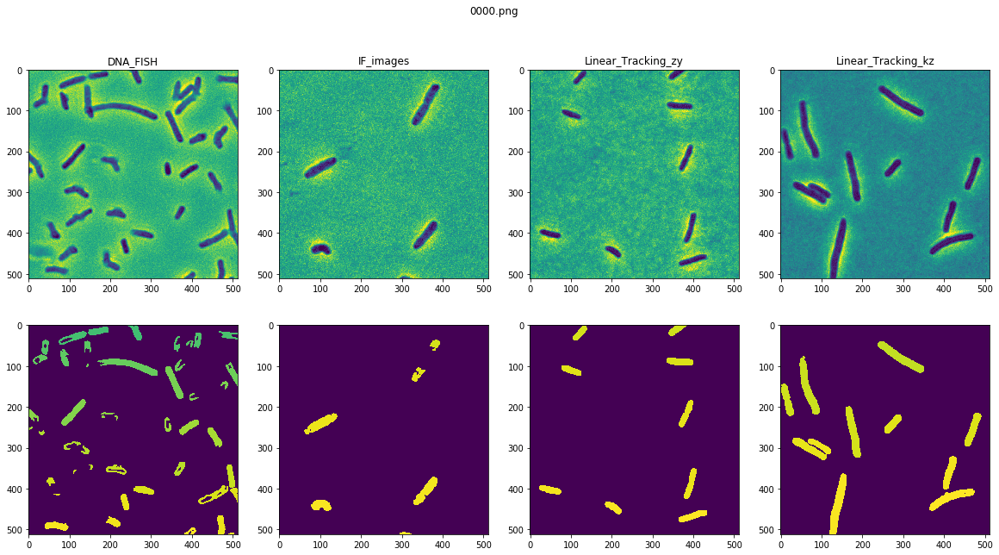

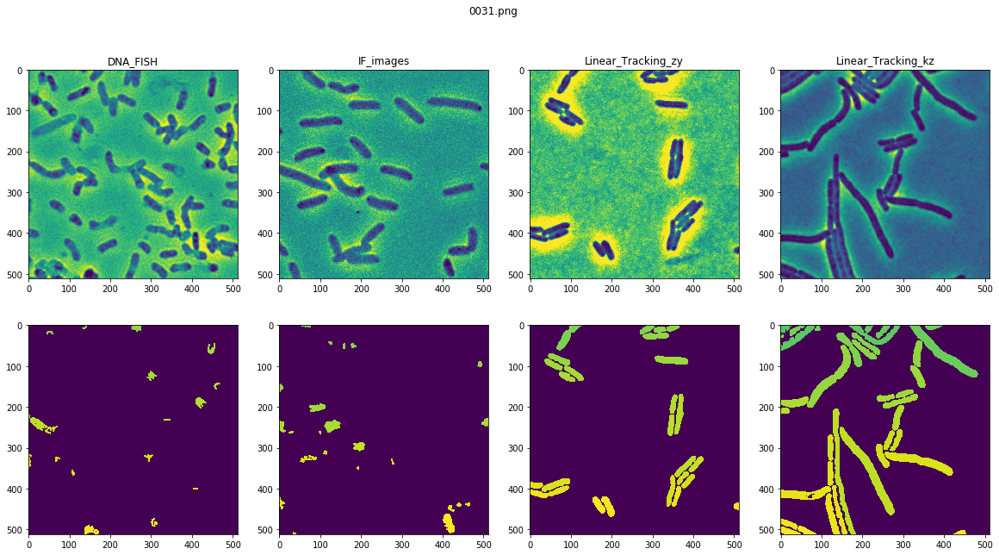

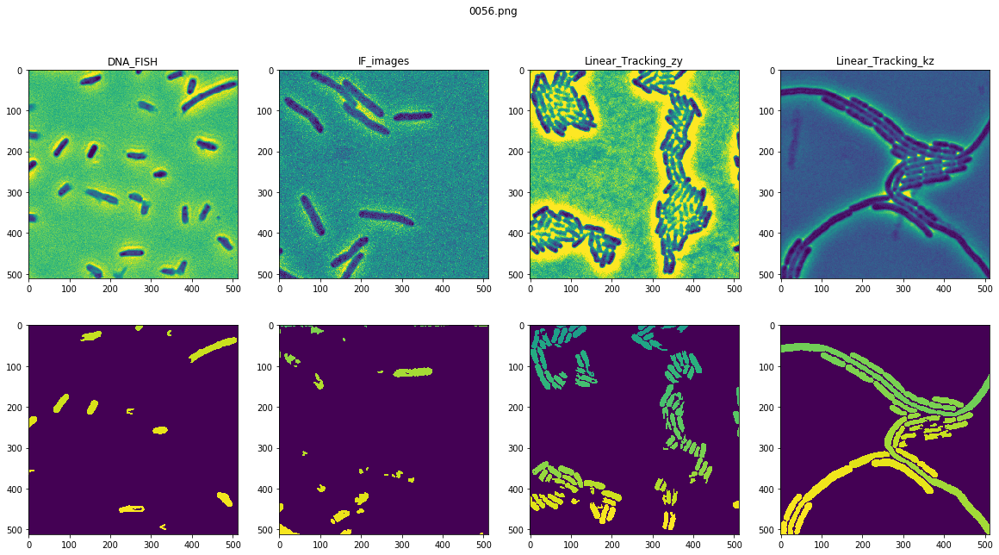

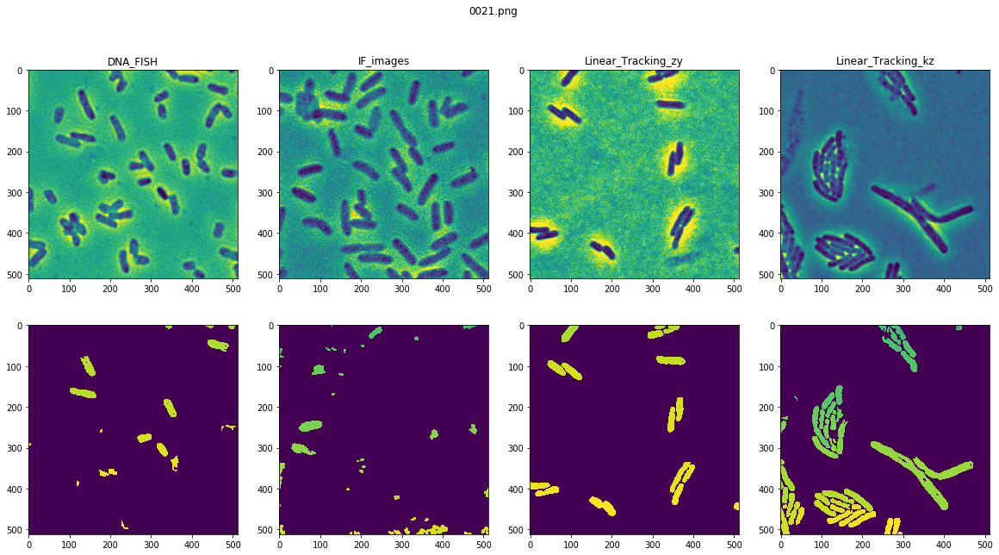

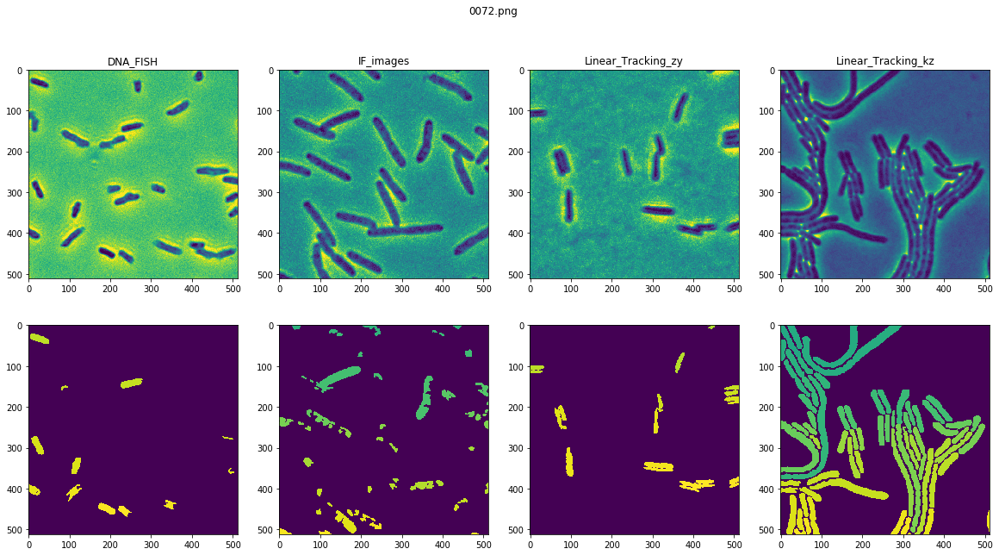

In [19]:
for i in np.random.randint(74, size = 20):
    img = "{:04}".format(i) + ".png"
    compare(img)